**Import Library**

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import torch
from torch import nn
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.naive_bayes import GaussianNB

import plotly.express as px

**Load Data**

In [2]:
data = pd.read_csv('C:/Users/metam/Pitjarus/Test Kerja (Portofolio)/Analysis/Education in egypt/dataset/egypt_education_dataset.csv')
data

,Student Name,Student Age,Student year,Father Degree,Mother Degree,Education Type,Subject_1,Subject_2,Subject_3,Subject_4,Subject_5,Subject_6,Subject_7,Subject_8,Subject_9,Subject_10
0,Allison Lang,18,Year 9,High School,High School,IB,72.236740,85.931149,65.698513,84.163844,78.179414,50.578209,70.071681,80.294509,72.709741,59.080678
1,Jaclyn Mcneil,14,Year 9,Bachelor,PhD,IB,91.603078,73.186427,64.240239,47.786542,83.138581,66.913702,42.587211,87.997009,89.176862,78.493158
2,Melissa Lee,16,Year 10,None,PhD,IB,100.000000,83.985923,89.378162,82.446853,86.368818,90.347020,100.000000,83.972296,69.212961,79.206634
3,Timothy Maxwell,14,Year 10,Bachelor,Bachelor,Thanweya,91.082131,100.000000,78.802220,78.447670,64.606239,82.045421,69.869099,91.122870,95.207752,52.602706
4,Eric Steele,17,Year 11,PhD,None,IGCSE,74.906144,69.518146,65.284841,56.317028,69.758140,85.810641,63.776955,61.802599,84.951132,68.146467
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,Bruce Vargas,15,Year 11,None,Master,IB,84.760901,96.154122,71.428657,52.579123,62.243286,63.188827,93.744022,72.375436,77.848848,66.807401
49996,Clarence Foley,16,Year 11,None,PhD,IGCSE,82.196281,84.939252,56.661299,88.210451,84.573156,73.009089,68.842074,76.605868,76.255564,80.606913
49997,Dawn Palmer,14,Year 10,PhD,PhD,Thanweya,90.035457,30.790153,64.771808,82.749067,52.774571,65.665893,74.760145,74.148929,64.687866,86.811651
49998,Albert Berry,15,Year 10,PhD,Bachelor,Thanweya,58.177784,81.879862,86.309918,100.000000,77.616452,89.898231,62.805221,57.548277,70.028551,80.779414


**Explore Data**

In [3]:
data.describe()

,Student Age,Subject_1,Subject_2,Subject_3,Subject_4,Subject_5,Subject_6,Subject_7,Subject_8,Subject_9,Subject_10
count,50000.00000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,16.00368,74.730855,74.697132,74.658231,74.789693,74.610735,74.741407,74.690653,74.734522,74.710284,74.689639
std,1.41582,14.345020,14.367525,14.330384,14.366513,14.326871,14.408353,14.348436,14.373802,14.355054,14.365250
min,14.00000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000
25%,15.00000,64.918132,64.786097,64.870431,64.884569,64.752157,64.837589,64.944466,64.985014,64.977238,64.845485
50%,16.00000,75.050027,74.916854,74.959196,75.045955,74.920325,75.083056,74.966657,74.949263,75.033263,74.987325
75%,17.00000,85.145231,85.139383,84.972541,85.268959,84.984459,85.208810,85.071789,85.119971,85.152224,85.087438
max,18.00000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Student Name    50000 non-null  object 
 1   Student Age     50000 non-null  int64  
 2   Student year    50000 non-null  object 
 3   Father Degree   50000 non-null  object 
 4   Mother Degree   50000 non-null  object 
 5   Education Type  50000 non-null  object 
 6   Subject_1       50000 non-null  float64
 7   Subject_2       50000 non-null  float64
 8   Subject_3       50000 non-null  float64
 9   Subject_4       50000 non-null  float64
 10  Subject_5       50000 non-null  float64
 11  Subject_6       50000 non-null  float64
 12  Subject_7       50000 non-null  float64
 13  Subject_8       50000 non-null  float64
 14  Subject_9       50000 non-null  float64
 15  Subject_10      50000 non-null  float64
dtypes: float64(10), int64(1), object(5)
memory usage: 6.1+ MB


In [5]:
data.shape

(50000, 16)

**Identify Missing Values**

In [6]:
data.isna().sum()

Student Name      0
Student Age       0
Student year      0
Father Degree     0
Mother Degree     0
Education Type    0
Subject_1         0
Subject_2         0
Subject_3         0
Subject_4         0
Subject_5         0
Subject_6         0
Subject_7         0
Subject_8         0
Subject_9         0
Subject_10        0
dtype: int64

**Identify Duplicated Data**

In [7]:
data.duplicated().sum()

0

**Analysis**

In [8]:
data['Student Age'].unique()

array([18, 14, 16, 17, 15], dtype=int64)

In [9]:
data['Student year'].unique()

array(['Year 9', 'Year 10', 'Year 11', 'Year 12'], dtype=object)

**Distribution Data**

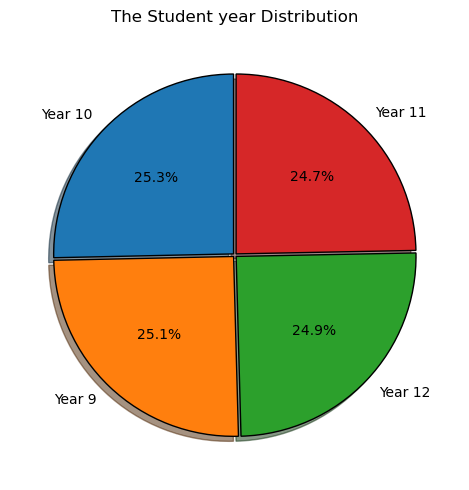

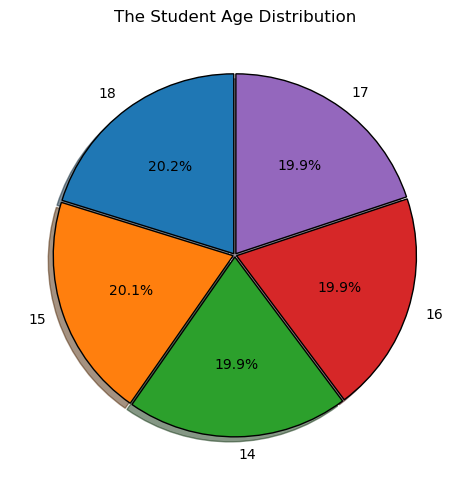

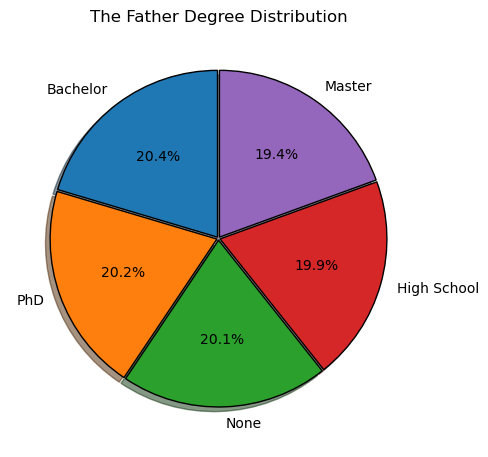

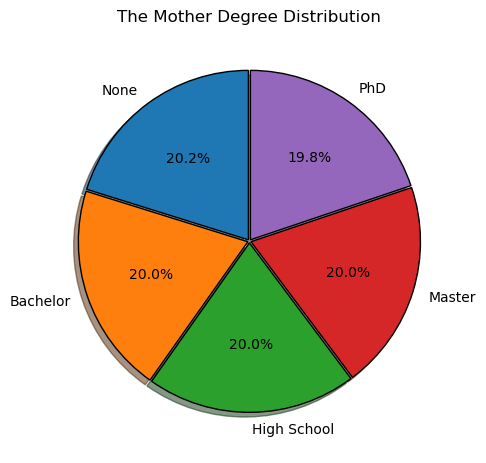

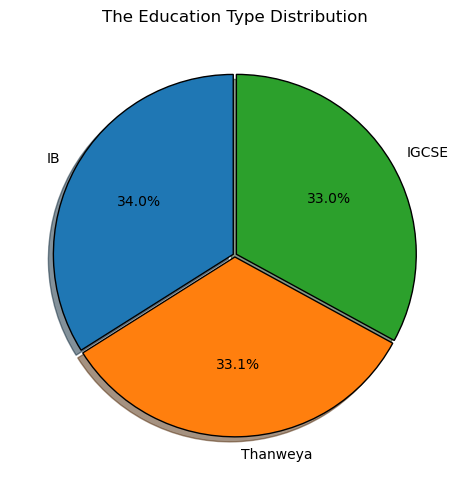

In [10]:
categorical_columns = ['Student year', 'Student Age', 'Father Degree', 'Mother Degree', 'Education Type']
for i in categorical_columns:
    x = data[i].value_counts()
    plt.figure(figsize=(5,5))
    plt.pie(x=x.values,
           labels = x.keys(),
           explode=[0.01] * len(x.keys()),
           autopct='%1.1f%%', startangle=90,
           wedgeprops={'edgecolor':'black'},
           shadow=True)
    plt.title(f'The {i} Distribution')
    plt.tight_layout()
    plt.show()

In [11]:
fig = px.histogram(data, x='Student Age', title='Distribution of Student Ages', nbins=10)
fig.show()

In [12]:
fig = px.histogram(data, x='Father Degree', title='Father Degree Distribution vs Mother Degree Distribution',
                  color='Mother Degree', barmode='overlay')

fig.show()

In [13]:
fig = px.histogram(data, x='Father Degree', title='Father Educational Degree Distributions', nbins=10)
fig.show()

In [14]:
fig = px.histogram(data, x='Mother Degree', title='Mother Educational Degree Distributions', nbins=10)
fig.show()

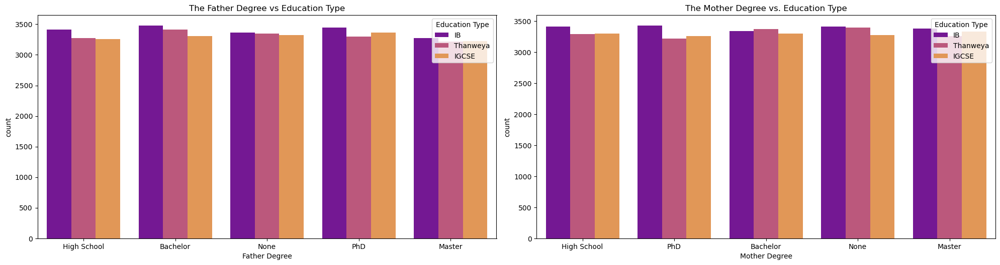

In [15]:
plt.figure(figsize=(20,10))
plt.subplot(2,2,1)
plt.title('The Father Degree vs Education Type')
sns.countplot(data=data, x='Father Degree', hue='Education Type', palette='plasma')
plt.subplot(2,2,2)
plt.title('The Mother Degree vs. Education Type')
sns.countplot(data=data, x='Mother Degree', hue='Education Type', palette='plasma')
plt.tight_layout()
plt.show()

In [16]:
fig = px.histogram(data, x='Student year', title='Distribution of Students by Academic Year', nbins=10)
fig.show()

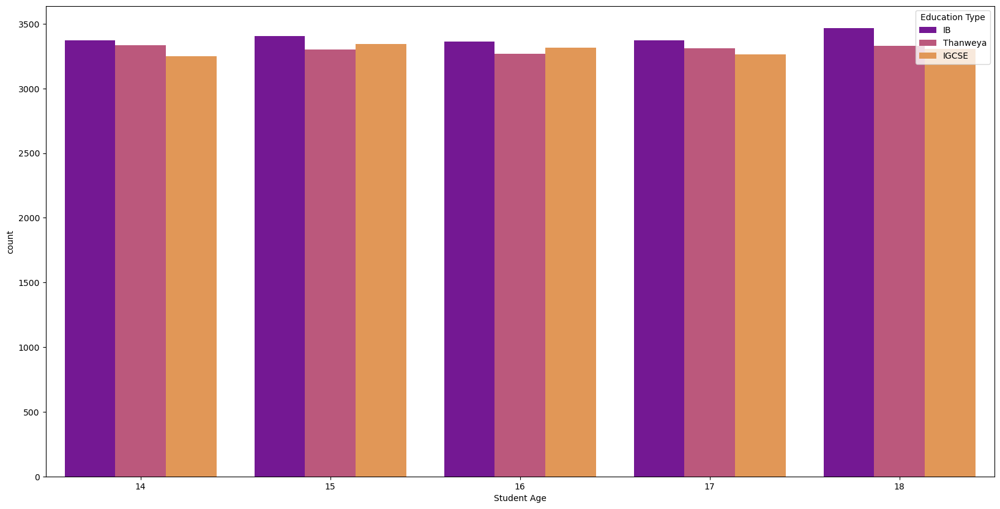

In [17]:
plt.figure(figsize=(20,10))
sns.countplot(data=data, x='Student Age', hue='Education Type', palette='plasma')
plt.show()

In [18]:
plt.figure(figsize=(20,10))
data['Total_Score'] = data[['Subject_1', 'Subject_2', 'Subject_3', 'Subject_4', 'Subject_5', 
                       'Subject_6', 'Subject_7', 'Subject_8', 'Subject_9', 'Subject_10']].sum(axis=1)

<Figure size 2000x1000 with 0 Axes>

In [19]:
fig = px.histogram(data, x='Total_Score', color='Education Type', barmode='overlay',
                  title='Total Score Across Different Education Types', nbins=20)

fig.show()

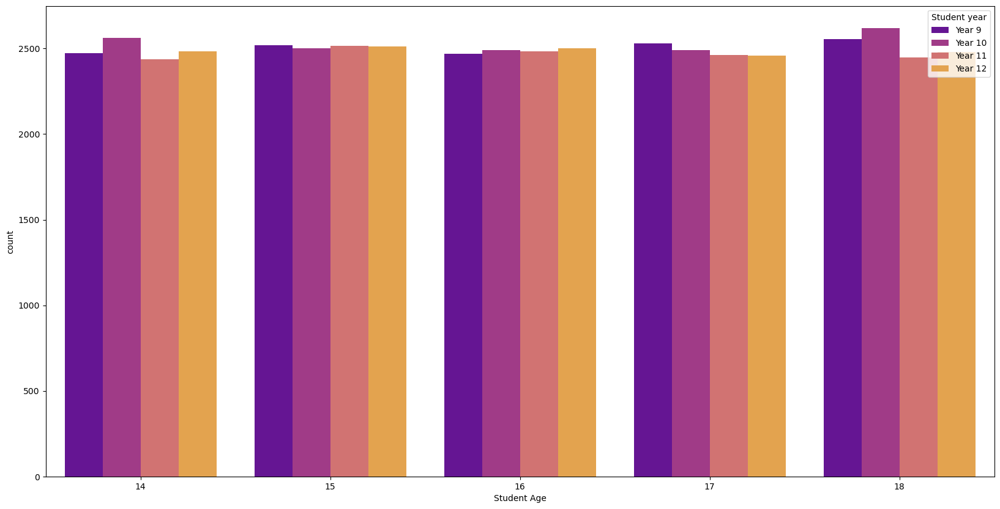

In [20]:
plt.figure(figsize=(20,10))
sns.countplot(data=data, x='Student Age', hue='Student year', palette='plasma')
plt.show()

In [21]:
x = data.drop(['Student Name', 'Student year','Father Degree', 'Mother Degree', 'Education Type', 'Student Age'], axis=1)
y = data['Education Type']

In [22]:
y.shape

(50000,)

In [23]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [24]:
x_train

,Subject_1,Subject_2,Subject_3,Subject_4,Subject_5,Subject_6,Subject_7,Subject_8,Subject_9,Subject_10,Total_Score
39087,100.000000,84.252217,67.829745,79.362287,100.000000,69.944336,76.389956,52.405702,63.589552,42.752410,736.526204
30893,100.000000,68.827056,58.530212,66.988052,86.540833,62.776681,73.125596,71.311391,91.524436,72.129819,751.754077
45278,85.258186,72.933937,62.034016,73.751685,81.566530,84.719897,83.764982,90.744490,62.318233,100.000000,797.091955
16398,80.715879,81.140541,74.881373,62.695845,100.000000,67.838732,76.439009,79.446768,60.613674,46.535817,730.307638
13653,60.570087,57.043572,71.790123,74.874064,71.625511,49.727738,74.169946,100.000000,62.814850,74.889814,697.505705
...,...,...,...,...,...,...,...,...,...,...,...
11284,65.559301,48.988588,69.618305,52.698439,77.455193,81.571267,89.107404,93.511669,87.009156,81.867172,747.386495
44732,96.267576,77.622845,76.724021,79.736330,88.901961,64.579557,54.461014,73.451195,93.786568,82.297550,787.828617
38158,100.000000,82.682592,67.966784,90.069207,72.668761,77.954490,71.976035,67.096610,100.000000,54.565690,784.980168
860,73.263678,78.256291,67.526738,42.826898,99.567863,87.024051,68.418579,100.000000,79.401690,94.660899,790.946687


In [25]:
y_train

39087       IGCSE
30893    Thanweya
45278       IGCSE
16398       IGCSE
13653          IB
           ...   
11284    Thanweya
44732    Thanweya
38158          IB
860            IB
15795    Thanweya
Name: Education Type, Length: 40000, dtype: object

In [26]:
model = GaussianNB()
models = model.fit(x_train, y_train)
pred = models.predict(x_test)
accuracy = accuracy_score(pred, y_test)
print('Accuracy is: ', round(accuracy*100, 2), '%')
print(classification_report(pred, y_test))

Accuracy is:  33.41 %
              precision    recall  f1-score   support

          IB       0.49      0.34      0.40      4888
       IGCSE       0.14      0.31      0.20      1530
    Thanweya       0.37      0.33      0.35      3582

    accuracy                           0.33     10000
   macro avg       0.33      0.33      0.32     10000
weighted avg       0.39      0.33      0.35     10000

